In [ ]:
import pandas as pd
import numpy as np
import matplotlib.pyplot as plt
import seaborn as sns
from sklearn.preprocessing import StandardScaler
import geopandas as gpd
import folium

In [ ]:
from google.colab import drive
drive.mount('/content/drive')

Mounted at /content/drive


In [ ]:
data_path = '/content/drive/MyDrive/CAPSTONE/Property_Assessment_Data.csv'
df = pd.read_csv(data_path, low_memory=False)

In [ ]:
#We drop columns AND ROWS w alot of missing values and that are not critical for analysis
df.dropna(axis=1, thresh=int(0.7 * len(df)), inplace=True) #columns were more than 30% of values NAN are dropped
df.dropna(axis=0, thresh=int(0.7 * len(df.columns)), inplace=True) #rows
#drop non relevant columns
df = df.drop(columns=['Account Number','House Number', 'Legal Description','Point Location','Assessment Class % 1'])
##Remove older records that may have been assessed under different standards or are outdated
df2= df[df['Assessment Year'].between(2021, 2024)]
df2 = df2.dropna()

#Exploring the distribution of features

##Remove small assessed values and lot sizes
##Add key features like property age and value per sq meter
##Convert garage to binary
##Restrain to only residential


In [ ]:
#Focus analysis on realistic, substantial properties
df2 = df2[(df2['Assessed Value'] > 100000) & (df2['Lot Size'] > 100)&
          (df2['Lot Size'] <= 5000)]
df2['Property Age'] = df2['Assessment Year'] - df2['Actual Year Built']
df2['Value per sq meter'] = df2['Assessed Value'] / df2['Lot Size']
#df2['Garage'] = df2['Garage'].map({'Y':1,'N':0})
# Convert to uppercase to catch variations like "Residential"
df2['Assessment Class 1'] = df2['Assessment Class 1'].str.upper()
# Filter to only residential properties
df_res1 = df2[df2['Assessment Class 1'] == 'RESIDENTIAL']

##Analyzing the distributions and the relationships to uncover patterns, correlations, and early signs of inequities in property assessments.
- Property age has a skewed(skewed toward new constr) distribution w multiple peaks
- Assessed value per sq m is also skewd w peak around $600/m²
- Distribution of lot size is skewed toward small lot sizes
- Restricted zoning to only single family residential properties

In [ ]:
#filtering the low-density residential zones for model accuracy
zones = ['RF1', 'RSL', 'RF2', 'RS', 'RSF', 'RSM']
df_res = df_res1[(df_res1['Zoning'].isin(zones)) & (df_res1['Garage'] == 'Y')].copy()

In [ ]:
df_res.info()

<class 'pandas.core.frame.DataFrame'>
Index: 682023 entries, 28 to 5070127
Data columns (total 13 columns):
 #   Column              Non-Null Count   Dtype  
---  ------              --------------   -----  
 0   Assessment Year     682023 non-null  int64  
 1   Street Name         682023 non-null  object 
 2   Latitude            682023 non-null  float64
 3   Longitude           682023 non-null  float64
 4   Neighbourhood       682023 non-null  object 
 5   Actual Year Built   682023 non-null  float64
 6   Garage              682023 non-null  object 
 7   Zoning              682023 non-null  object 
 8   Lot Size            682023 non-null  float64
 9   Assessed Value      682023 non-null  float64
 10  Assessment Class 1  682023 non-null  object 
 11  Property Age        682023 non-null  float64
 12  Value per sq meter  682023 non-null  float64
dtypes: float64(7), int64(1), object(5)
memory usage: 72.8+ MB


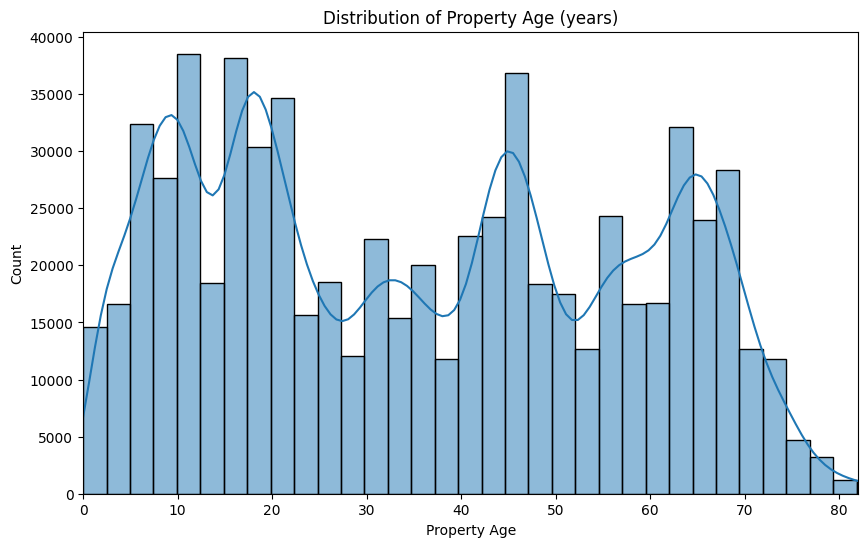

In [ ]:
plt.figure(figsize=(10, 6))
sns.histplot(df_res['Property Age'], bins=50, kde=True)
plt.title('Distribution of Property Age (years)')
plt.xlabel('Property Age')
plt.ylabel('Count')
plt.xlim(0, df_res['Property Age'].quantile(0.99))
plt.show()


Kernel Density Estimate (KDE) shows were age ranges are concentrated
large number of properties are under 20 years old
distinct waves of construction as shown by the multiple peaks
we conclude age is not normally distributed

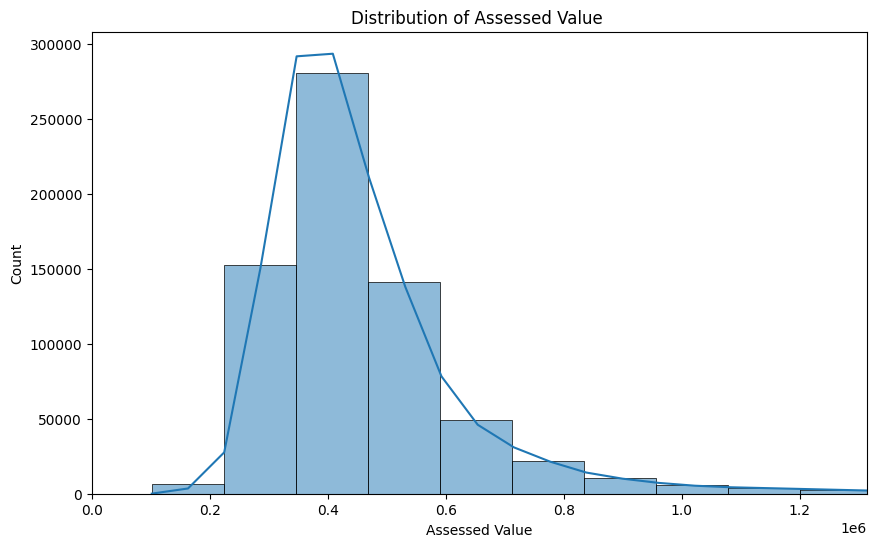

In [ ]:
plt.figure(figsize=(10, 6))
sns.histplot(df_res['Assessed Value'], bins=100, kde=True)
plt.title('Distribution of Assessed Value ')
plt.xlabel('Assessed Value')
plt.ylabel('Count')
plt.xlim(0, df_res['Assessed Value'].quantile(0.99))
plt.show()


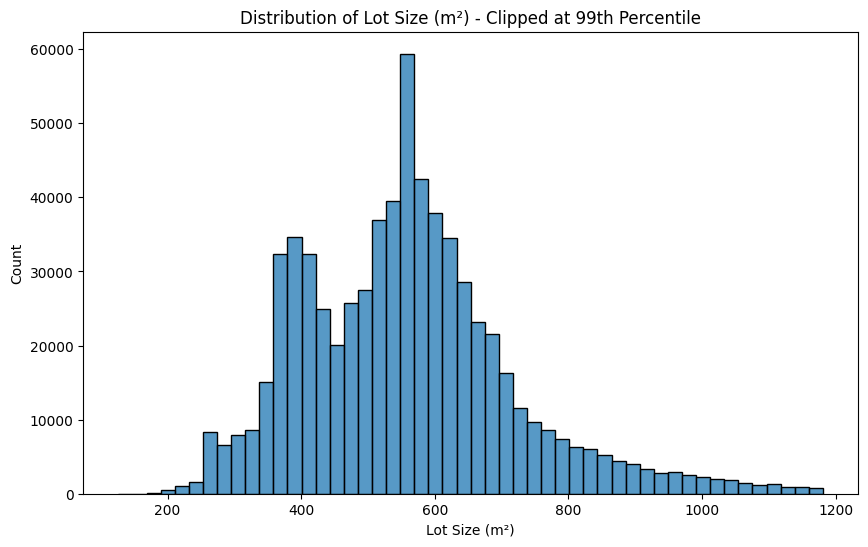

In [ ]:
 #focus on the 99% of typical lot sizes
lot_size_clipped = df_res['Lot Size'][df_res['Lot Size'] < df_res['Lot Size'].quantile(0.99)]

plt.figure(figsize=(10, 6))
sns.histplot(lot_size_clipped, bins=50)
plt.title('Distribution of Lot Size (m²) - Clipped at 99th Percentile')
plt.xlabel('Lot Size (m²)')
plt.ylabel('Count')
plt.show()


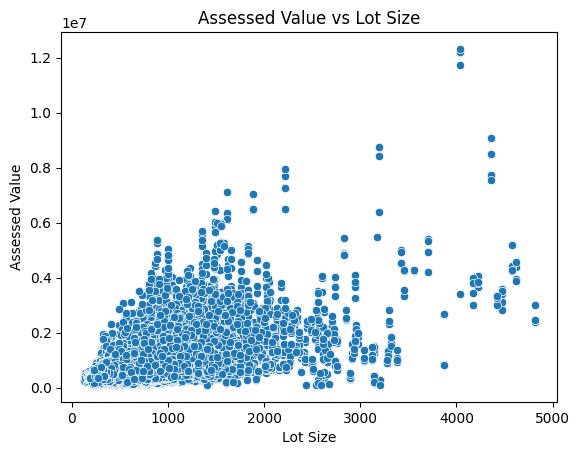

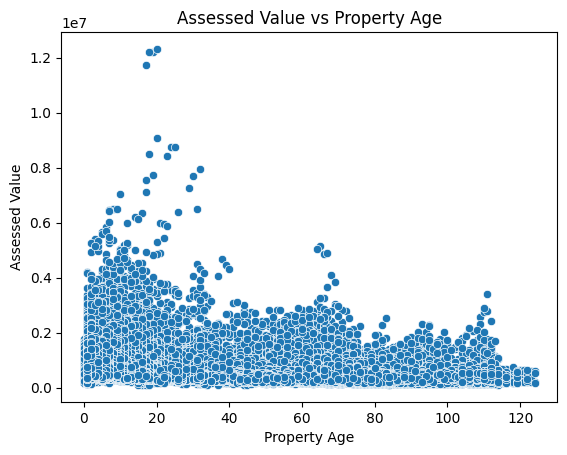

In [ ]:
#df_res['clipped_assessed'] = df_res['Assessed Value'][df_res['Assessed Value'] < df_res['Assessed Value'].quantile(0.99)]

sns.scatterplot(data=df_res, x='Lot Size', y='Assessed Value')
plt.title('Assessed Value vs Lot Size')
plt.show()

sns.scatterplot(data=df_res, x='Property Age', y='Assessed Value')
plt.title('Assessed Value vs Property Age')
plt.show()

##Normalizing features that are skewed

In [ ]:
#Logtransforming Value per sq meter and property ages
#df_res['Log Value per sq meter'] = np.log1p(df_res['Value per sq meter'])
#df_res['Log Property Age'] = np.log1p(df_res['Property Age'])
df_res['Log Assessed Value'] = np.log1p(df_res['Assessed Value'])
df_res['Log Lot Size'] = np.log1p(df_res['Lot Size'])
#df_res['Log Latitude'] = np.log1p(df_res['Latitude'])
#df_res['Log Longitude'] = np.log1p(df_res['Longitude'])
df_res["Neighbourhood"] = df_res["Neighbourhood"].replace({
    "WESTBROOK ESTATE": "WESTBROOK ESTATES"
})
 # Count properties per neighbourhood
counts = df_res['Neighbourhood'].value_counts()

# Keep only neighbourhoods with >= 20 properties
valid_neigh = counts[counts >= 20].index

# Filter the dataframe
df_res = df_res[df_res['Neighbourhood'].isin(valid_neigh)]


QQPLOT THAT JUSTIFY LOG TRANSFORMATION IMPROVEMENT

Multicollinearity Check
Quick variance inflation factor (VIF) or correlation check to ensure predictors aren’t redundant.

In [ ]:
df_res[['Assessed Value','Lot Size','Property Age']].corr(method='pearson')


,Assessed Value,Lot Size,Property Age
Assessed Value,1.000000,0.381293,-0.326324
Lot Size,0.381293,1.000000,0.326251
Property Age,-0.326324,0.326251,1.000000


#COOKS DISTANCE

In [ ]:
import statsmodels.formula.api as smf

# variables
cols = [
    'Log Assessed Value', 'Log Lot Size', 'Property Age',
    'Latitude', 'Longitude', 'Neighbourhood', 'Zoning'
]
df_reg = df_res[cols].dropna().copy()

# Fit hedonic regression model
formula = """
    Q("Log Assessed Value") ~
    Q("Log Lot Size") + Q("Property Age") + Latitude + Longitude +
    C(Neighbourhood) + C(Zoning)
"""

model = smf.ols(formula=formula, data=df_reg)
results = model.fit()

print(results.summary())


                               OLS Regression Results                              
Dep. Variable:     Q("Log Assessed Value")   R-squared:                       0.796
Model:                                 OLS   Adj. R-squared:                  0.796
Method:                      Least Squares   F-statistic:                     9757.
Date:                     Fri, 12 Dec 2025   Prob (F-statistic):               0.00
Time:                             02:16:49   Log-Likelihood:             3.1738e+05
No. Observations:                   682018   AIC:                        -6.342e+05
Df Residuals:                       681744   BIC:                        -6.311e+05
Df Model:                              273                                         
Covariance Type:                 nonrobust                                         
                                                          coef    std err          t      P>|t|      [0.025      0.975]
----------------------------------------

In [ ]:

influence = results.get_influence()
cooks_d = influence.cooks_distance[0]

df_reg["CooksD"] = cooks_d

In [ ]:
threshold = np.percentile(df_reg["CooksD"], 99)
df_reg['Cook_Outlier'] = df_reg['CooksD'] > threshold
df_reg['Cook_Outlier'].mean()


np.float64(0.01000120231430842)

/usr/local/lib/python3.12/dist-packages/IPython/core/pylabtools.py:151: UserWarning: Creating legend with loc="best" can be slow with large amounts of data.
  fig.canvas.print_figure(bytes_io, **kw)


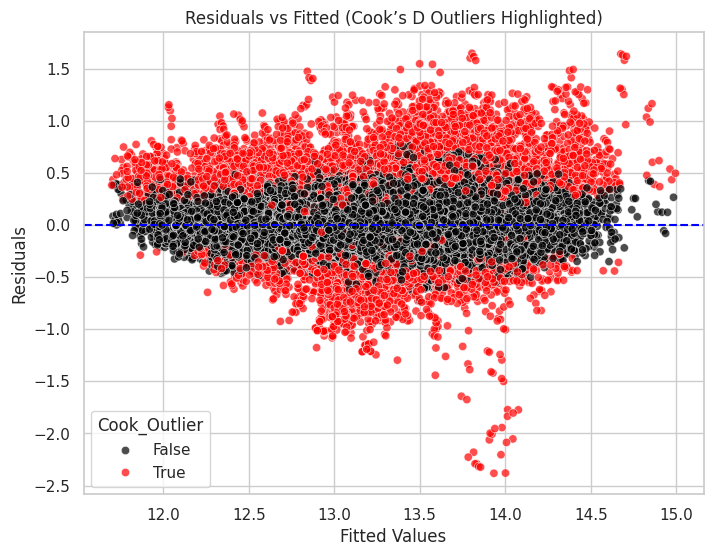

In [ ]:
plt.figure(figsize=(8, 6))
sns.scatterplot(
    x=fitted,
    y=residuals,
    hue=df_reg["Cook_Outlier"],
    palette={True: "red", False: "black"},
    alpha=0.7
)
plt.axhline(0, color='blue', linestyle='--')

plt.xlabel("Fitted Values")
plt.ylabel("Residuals")
plt.title("Residuals vs Fitted (Cook’s D Outliers Highlighted)")
plt.show()


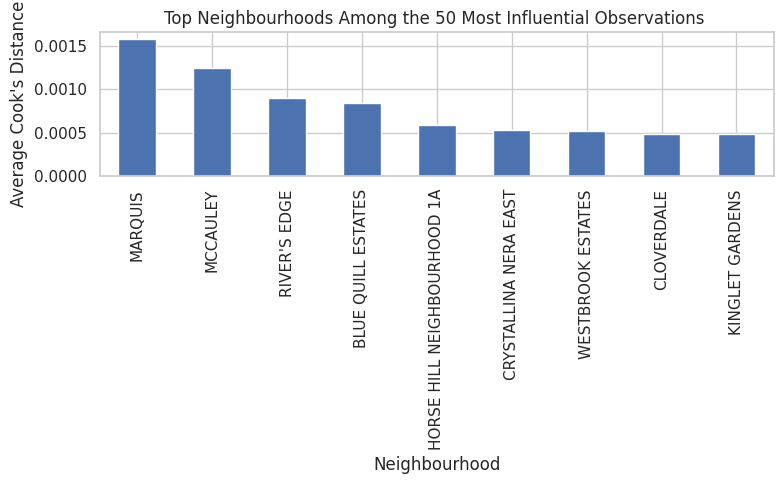

In [ ]:
# Sort by Cook's Distance

top30_idx = df_reg["CooksD"].sort_values(ascending=False).head(50).index

# Retrieve the rows with neighbourhood info
top30_df = df_reg.loc[top30_idx, ["CooksD", "Neighbourhood", "Log Assessed Value", "Log Lot Size"]]
#top20_clean = top30_df[top30_df["Neighbourhood2"] != "Other"]

# Group again after removing “Other”
top20_neigh = (
    top30_df.groupby("Neighbourhood")["CooksD"]
    .mean()
    .sort_values(ascending=False)
)

plt.figure(figsize=(8,5))
top20_neigh.plot(kind="bar")
plt.ylabel("Average Cook's Distance")
plt.title("Top Neighbourhoods Among the 50 Most Influential Observations ")
plt.tight_layout()
plt.show()



/tmp/ipython-input-118731740.py:11: FutureWarning: 

Passing `palette` without assigning `hue` is deprecated and will be removed in v0.14.0. Assign the `x` variable to `hue` and set `legend=False` for the same effect.

  sns.boxplot(x='OutlierLabel', y=col, data=df_reg,
/tmp/ipython-input-118731740.py:11: FutureWarning: 

Passing `palette` without assigning `hue` is deprecated and will be removed in v0.14.0. Assign the `x` variable to `hue` and set `legend=False` for the same effect.

  sns.boxplot(x='OutlierLabel', y=col, data=df_reg,
/tmp/ipython-input-118731740.py:11: FutureWarning: 

Passing `palette` without assigning `hue` is deprecated and will be removed in v0.14.0. Assign the `x` variable to `hue` and set `legend=False` for the same effect.

  sns.boxplot(x='OutlierLabel', y=col, data=df_reg,


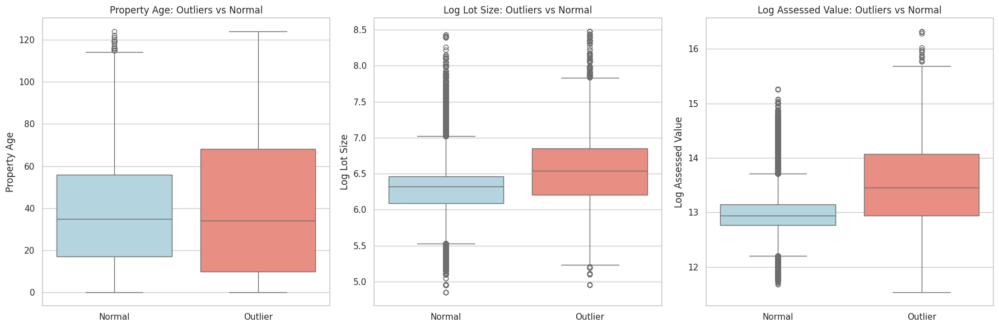

In [ ]:

# Create a flag for plotting
df_reg['OutlierLabel'] = df_reg['Cook_Outlier'].map({True: 'Outlier', False: 'Normal'})

# Columns to plot
cols_to_plot = ['Property Age', 'Log Lot Size', 'Log Assessed Value']

# Create subplots: 1 row, 3 columns
fig, axes = plt.subplots(1, 3, figsize=(18,6))

for ax, col in zip(axes, cols_to_plot):
    sns.boxplot(x='OutlierLabel', y=col, data=df_reg,
                palette=['lightblue','salmon'], ax=ax)
    ax.set_title(f"{col}: Outliers vs Normal")
    ax.set_xlabel('')
    ax.set_ylabel(col)

plt.tight_layout()
plt.show()


In [ ]:
import geopandas
data_path2 = '/content/drive/MyDrive/CAPSTONE/Neighbourhood_Boundaries.shp'
neigh_gdf= gpd.read_file(data_path2)

#ISOLATION  FOREST

In [ ]:
pip install category_encoders

   ━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━ 85.9/85.9 kB 3.3 MB/s eta 0:00:00


In [ ]:
from sklearn.ensemble import IsolationForest
from category_encoders import TargetEncoder


# --- Encode Neighbourhood ---
neigh_encoder = TargetEncoder(cols=['Neighbourhood'])
df_res['Neighbourhood_encoded'] = neigh_encoder.fit_transform(
    df_res[['Neighbourhood']],
    df_res['Log Assessed Value']
)

# --- Encode Zoning ---
zone_encoder = TargetEncoder(cols=['Zoning'])
df_res['Zoning_encoded'] = zone_encoder.fit_transform(
    df_res[['Zoning']],
    df_res['Log Assessed Value']
)

# Feature sets
feature_sets = {

    "full_set": [
        "Latitude", "Longitude",
        "Neighbourhood_encoded",
        "Property Age", "Log Lot Size",
        "Zoning_encoded",
        "Log Assessed Value"
    ],

    "spatial_value": [
        "Latitude", "Longitude",
        "Neighbourhood_encoded",
        "Zoning_encoded",
        "Log Assessed Value"
    ],

    "structural_value": [
        "Property Age",
        "Log Lot Size",
        "Log Assessed Value"
    ],

    "value_minimal": [
        "Neighbourhood_encoded",
        "Log Lot Size",
        "Log Assessed Value"
    ]
}

In [ ]:
results = {}
contamination_values = [0.05]

for set_name, features in feature_sets.items():
    print(f"\n--- Running feature set: {set_name} ---")

    X = df_res[features]

    for cont in contamination_values:
        print(f"  -> Contamination: {cont}")

        iso = IsolationForest(
            n_estimators=300,
            max_samples=256,
            contamination=cont,
            n_jobs=-1,
            random_state=42,
            verbose=0
        )

        iso.fit(X)

        scores = iso.decision_function(X)
        predictions = iso.predict(X)

        results[(set_name, cont)] = {
            "features_used": features,
            "scores": scores,
            "labels": predictions
        }

        print(f"     Finished. Outliers found: {(predictions == -1).sum()}")


--- Running feature set: full_set ---
  -> Contamination: 0.05
     Finished. Outliers found: 34101

--- Running feature set: spatial_value ---
  -> Contamination: 0.05
     Finished. Outliers found: 34101

--- Running feature set: structural_value ---
  -> Contamination: 0.05
     Finished. Outliers found: 34101

--- Running feature set: value_minimal ---
  -> Contamination: 0.05
     Finished. Outliers found: 34101


In [ ]:

labels_full = results[("full_set", 0.05)]["labels"]
labels_spatial = results[("spatial_value", 0.05)]["labels"]
labels_struct = results[("structural_value", 0.05)]["labels"]
labels_minimal = results[("value_minimal", 0.05)]["labels"]

consistent_outliers = np.where(
    (labels_full == -1) &
    (labels_spatial == -1) &
    (labels_struct == -1) &
    (labels_minimal == -1)
)[0]

print("Consistent outliers across all sets:", len(consistent_outliers))


Consistent outliers across all sets: 13891


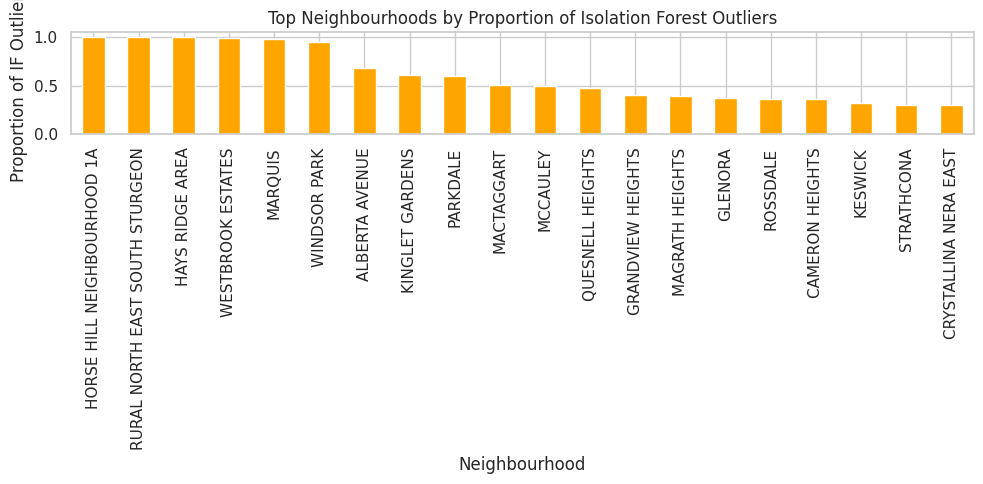

In [ ]:
# Total properties per neighbourhood
df_if = df_res.copy()
df_if["IF_outlier"] = (labels_full == -1)
total_counts = df_res.groupby("Neighbourhood").size()

# IF anomalies per neighbourhood
if_counts = df_if[df_if["IF_outlier"]].groupby("Neighbourhood").size()

# Merge + compute proportion
neigh_if = (if_counts / total_counts).sort_values(ascending=False)

top20_prop = neigh_if.head(20)

plt.figure(figsize=(10,5))
top20_prop.plot(kind="bar", color="orange")
plt.ylabel("Proportion of IF Outliers")
plt.title("Top Neighbourhoods by Proportion of Isolation Forest Outliers")
plt.xticks(rotation=90)
plt.tight_layout()
plt.show()


/tmp/ipython-input-936716921.py:14: FutureWarning: 

Passing `palette` without assigning `hue` is deprecated and will be removed in v0.14.0. Assign the `x` variable to `hue` and set `legend=False` for the same effect.

  sns.boxplot(x='OutlierLabel', y=col, data=df_res,
/tmp/ipython-input-936716921.py:14: FutureWarning: 

Passing `palette` without assigning `hue` is deprecated and will be removed in v0.14.0. Assign the `x` variable to `hue` and set `legend=False` for the same effect.

  sns.boxplot(x='OutlierLabel', y=col, data=df_res,
/tmp/ipython-input-936716921.py:14: FutureWarning: 

Passing `palette` without assigning `hue` is deprecated and will be removed in v0.14.0. Assign the `x` variable to `hue` and set `legend=False` for the same effect.

  sns.boxplot(x='OutlierLabel', y=col, data=df_res,


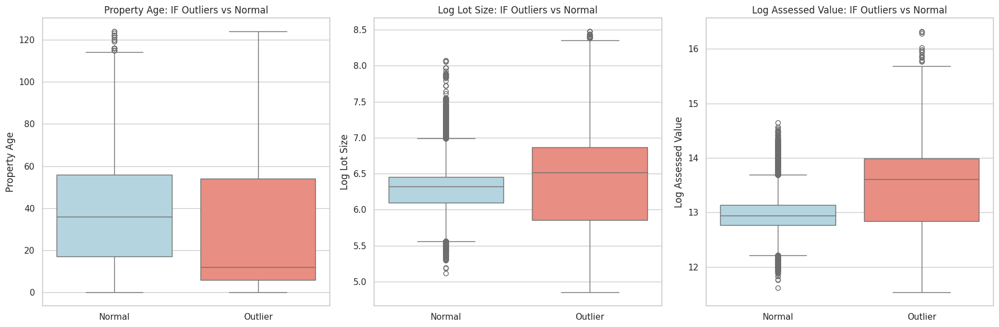

In [ ]:
# Flag properties as outliers based on Isolation Forest
df_res['IF_Outlier'] = (labels_full == -1)  # True if outlier

# Columns to plot
cols_to_plot = ['Property Age', 'Log Lot Size', 'Log Assessed Value']

# Map for labeling
df_res['OutlierLabel'] = df_res['IF_Outlier'].map({True: 'Outlier', False: 'Normal'})

# Create subplots: 1 row, 3 columns
fig, axes = plt.subplots(1, 3, figsize=(18,6))

for ax, col in zip(axes, cols_to_plot):
    sns.boxplot(x='OutlierLabel', y=col, data=df_res,
                palette=['lightblue','salmon'], ax=ax)
    ax.set_title(f"{col}: IF Outliers vs Normal")
    ax.set_xlabel('')
    ax.set_ylabel(col)

plt.tight_layout()
plt.show()


In [ ]:

# Flag consistent IF outliers
df_res['IF_Outlier'] = False
df_res.iloc[consistent_outliers, df_res.columns.get_loc('IF_Outlier')] = True

# Flag Cook's D outliers
df_res['Cook_Outlier'] = df_reg['Cook_Outlier']

# Compute metrics
if_outliers = df_res['IF_Outlier']
cook_outliers = df_res['Cook_Outlier']

precision = (if_outliers & cook_outliers).sum() / if_outliers.sum()
recall = (if_outliers & cook_outliers).sum() / cook_outliers.sum()
f1_score = 2 * (precision * recall) / (precision + recall)

# Create summary table
metrics_summary = pd.DataFrame({
    "Metric": [
        "Number of Cook's D outliers",
        "Number of consistent IF outliers",
        "Precision (IF ∩ Cook / IF)",
        "Recall (IF ∩ Cook / Cook)",
        "F1 Score"
    ],
    "Value": [
        cook_outliers.sum(),
        if_outliers.sum(),
        precision,
        recall,
        f1_score
    ]
})

metrics_summary


,Metric,Value
0,Number of Cook's D outliers,6821.000000
1,Number of consistent IF outliers,13891.000000
2,Precision (IF ∩ Cook / IF),0.178029
3,Recall (IF ∩ Cook / Cook),0.362557
4,F1 Score,0.238799


In [ ]:
# Base map centered on Edmonton
m = folium.Map(location=[53.5461, -113.4938], zoom_start=10)
neigh_coords_plot = neigh_coords[neigh_coords['Category'] != 'None']

# Color map for categories
color_map = {
    'Both': 'purple',
    'Cook only': 'blue',
    'IF only': 'orange',
    #'None': 'lightgray'
}

# Add neighborhood markers
for idx, row in neigh_coords_plot.iterrows():
    folium.CircleMarker(
        location=[row['Latitude'], row['Longitude']],
        radius=8,
        color=color_map[row['Category']],
        fill=True,
        fill_color=color_map[row['Category']],
        fill_opacity=0.7,
        popup=f"{row['Neighbourhood']} ({row['Category']})"
    ).add_to(m)

# Display map
m


visualizing the outliers from isolation forest

In [ ]:
# Create a DataFrame containing only consistent Isolation Forest outliers
df_outliers_IF = df_res.iloc[consistent_outliers].copy()

print(df_outliers_IF.shape)
df_outliers_IF.head()


(11083, 16)


,Assessment Year,Street Name,Latitude,Longitude,Neighbourhood,Actual Year Built,Garage,Zoning,Lot Size,Assessed Value,Assessment Class 1,Property Age,Value per sq meter,Log Assessed Value,Log Lot Size,Neighbourhood_encoded
1897,2023,149 STREET NW,53.55344,-113.57860,HIGH PARK,1941.0,Y,RF1,681.466,192500.0,RESIDENTIAL,82.0,282.479243,12.167857,6.525713,12.646012
2428,2022,149 STREET NW,53.55656,-113.57856,HIGH PARK,1951.0,Y,RF1,566.646,147500.0,RESIDENTIAL,71.0,260.303611,11.901590,6.341498,12.646012
3035,2021,149 STREET NW,53.55344,-113.57860,HIGH PARK,1941.0,Y,RF1,681.466,179000.0,RESIDENTIAL,80.0,262.669011,12.095147,6.525713,12.646012
3933,2021,109 AVENUE NW,53.55430,-113.58211,HIGH PARK,1952.0,Y,RF1,577.524,181500.0,RESIDENTIAL,69.0,314.272654,12.109016,6.360480,12.646012
4246,2023,152 STREET NW,53.54876,-113.58284,CANORA,1946.0,Y,RF2,931.059,170000.0,RESIDENTIAL,77.0,182.587784,12.043560,6.837396,12.646409


In [ ]:
# Boolean mask for consistent outliers
mask_consistent = np.zeros(len(df_res), dtype=bool)
mask_consistent[consistent_outliers] = True

# Split the dataset
df_out = df_res[mask_consistent]
df_normal = df_res[~mask_consistent]


#Training a Random Forest regressor to predict assessed value
##This is a model-based anomaly detection approach
##Built a RF regressor
##Splitted data into training 80% and testing 20%
##Performed residuals analysis to spot outliers
##Extracted feature importance
##Target encoded Neighbourhood as it has a lot of categories

In [ ]:
from sklearn.ensemble import RandomForestRegressor
from sklearn.preprocessing import OneHotEncoder
from sklearn.compose import ColumnTransformer
from sklearn.pipeline import Pipeline
from sklearn.model_selection import train_test_split
from sklearn.metrics import r2_score, mean_absolute_error
#from category_encoders import TargetEncoder
# ---- Model Pipeline ----
features = ['Neighbourhood', 'Zoning', 'Latitude', 'Longitude', 'Property Age', 'Log Lot Size']
target = 'Log Assessed Value'
X = df_res[features]
Y = df_res[target]
X_train, X_test, y_train, y_test = train_test_split(X, Y, test_size=0.2, random_state=42)
# Target encoding for Neighbourhood (trained only on training data)
target_encoder = TargetEncoder(cols=['Neighbourhood'])
onehot_encoder = OneHotEncoder(handle_unknown='ignore')
preprocessor = ColumnTransformer(
    transformers=[
        ('target_neigh', target_encoder, ['Neighbourhood']),
        ('onehot_zone', onehot_encoder, ['Zoning']),
        ('num', 'passthrough', ['Latitude', 'Longitude', 'Property Age', 'Log Lot Size'])
    ]
)
pipeline = Pipeline(steps=[
    ('preprocess', preprocessor),
    ('model', RandomForestRegressor(n_estimators=50, random_state=42, n_jobs=-1,max_depth=15, max_features='sqrt'))
])
pipeline.fit(X_train, y_train) # Train the model
y_pred = pipeline.predict(X_test) # Evaluate the model
mae = mean_absolute_error(y_test, y_pred)
r2 = r2_score(y_test, y_pred)
print(f"MAE: {mae:.4f}")
print(f"R²: {r2:.4f}")

MAE: 0.0816
R²: 0.8891


Perfomance evaluation with cross validation

In [ ]:
from sklearn.model_selection import cross_val_score
# Perform cross-validation
cv_scores= cross_val_score(pipeline, X, Y, cv=3, scoring='r2', n_jobs=-1)
print(" R² scores for each fold:", cv_scores)
print("Average R²:", np.mean(cv_scores))

 R² scores for each fold: [0.80354204 0.77043892 0.70331983]
Average R²: 0.7591002635704029


MAE: mean absolute error is Robust to outliers compared to MSE.
the MAE =0.0812 suggests that model’s predicted assessed value differs from the true assessed value by roughly ±8%

Checking the residuals normality

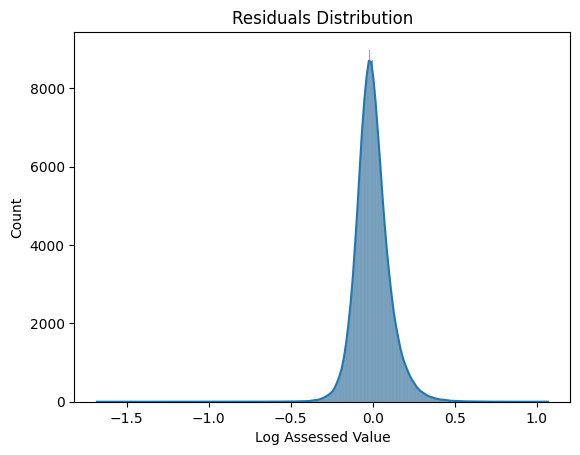

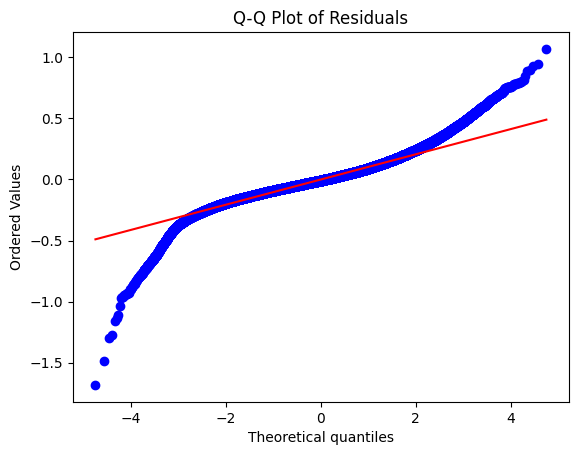

In [ ]:
import scipy.stats as stats
y_all_pred=pipeline.predict(X)
residuals = Y - y_all_pred
# Histogram with KDE
sns.histplot(residuals, kde=True)
plt.title("Residuals Distribution")
plt.show()

# Q-Q plot
stats.probplot(residuals, dist="norm", plot=plt)
plt.title("Q-Q Plot of Residuals")
plt.show()

In [ ]:
#residuals with cross validation
from sklearn.model_selection import cross_val_predict

# Out-of-fold predictions
y_pred_cv = cross_val_predict(pipeline, X, Y, cv=3, n_jobs=-1)

# Residuals
residuals_cv = Y - y_pred_cv


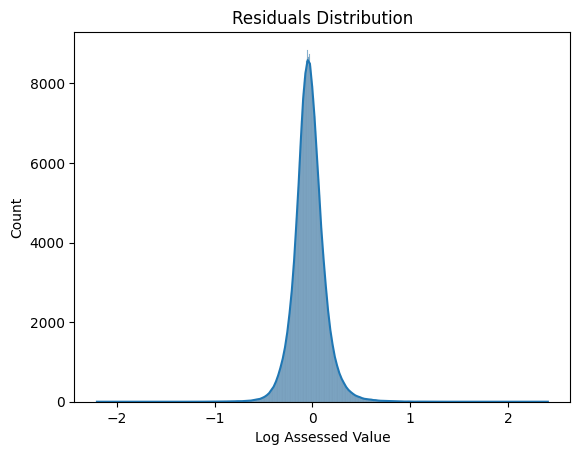

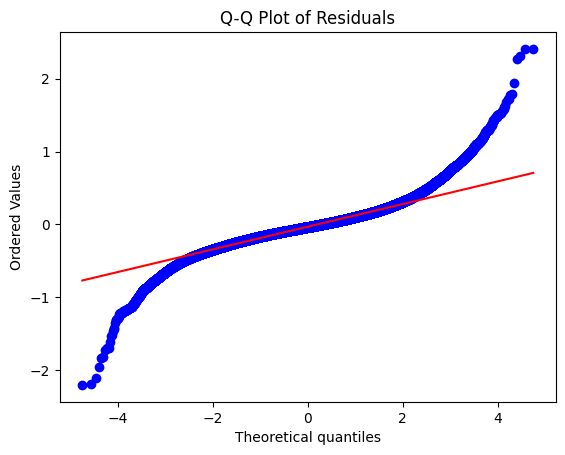

In [ ]:
# Histogram with KDE
sns.histplot(residuals_cv, kde=True)
plt.title("Residuals Distribution")
plt.show()

# Q-Q plot
stats.probplot(residuals_cv, dist="norm", plot=plt)
plt.title("Q-Q Plot of Residuals")
plt.show()

As the dist is not normal we use IQR to detect outliers
 we identify outlier if it has a value 1.5 times greater than the IQR or 1.5 times less than the IQR.

In [ ]:
# Compute IQR
Q1 = np.percentile(residuals_cv, 25)
Q3 = np.percentile(residuals_cv, 75)
IQR = Q3 - Q1

# Define outlier bounds
lower_bound = Q1 - 1.5 * IQR
upper_bound = Q3 + 1.5 * IQR

# Identify outliers

outliers_mask = (residuals_cv < lower_bound) | (residuals_cv > upper_bound)
outliers = df_res[outliers_mask].copy()

#outliers = X_test.loc[outliers_mask].copy()
#outliers['Residual'] = residuals[outliers_mask]


print(f"Number of outliers: {len(outliers)}")

Number of outliers: 28124


In [ ]:
#confidence interval on residuals
lower_ci, upper_ci = np.percentile(residuals_cv, [2.5, 97.5])
print(f"95% CI on residuals: ({lower_ci:.2f}, {upper_ci:.2f})")


95% CI on residuals: (-0.34, 0.30)


In [ ]:
outliers.to_csv('outliers.csv', index=False)

In [ ]:
path_df= '/content/drive/MyDrive/outliers.csv'
outliers_df = pd.read_csv(path_df,low_memory=False)

In [ ]:
outliers_df.info()

<class 'pandas.core.frame.DataFrame'>
RangeIndex: 53142 entries, 0 to 53141
Data columns (total 18 columns):
 #   Column                  Non-Null Count  Dtype  
---  ------                  --------------  -----  
 0   Assessment Year         53142 non-null  int64  
 1   Street Name             53142 non-null  object 
 2   Latitude                53142 non-null  float64
 3   Longitude               53142 non-null  float64
 4   Point Location          53142 non-null  object 
 5   Neighbourhood           53142 non-null  object 
 6   Actual Year Built       53142 non-null  float64
 7   Garage                  53142 non-null  int64  
 8   Zoning                  53142 non-null  object 
 9   Lot Size                53142 non-null  float64
 10  Assessed Value          53142 non-null  float64
 11  Assessment Class 1      53142 non-null  object 
 12  Property Age            53142 non-null  float64
 13  Value per sq meter      53142 non-null  float64
 14  Log Value per sq meter  53142 non-null

#We are now to check the robustness of the model by trying a different algortithm. we will use gradient boosting

In [ ]:
from sklearn.ensemble import GradientBoostingRegressor
# ---- Model Pipeline ----
features = ['Neighbourhood', 'Zoning', 'Latitude', 'Longitude', 'Property Age', 'Log Lot Size']
target = 'Log Assessed Value'

X = df_res[features]
Y = df_res[target]

X_train, X_test, y_train, y_test = train_test_split(X, Y, test_size=0.2, random_state=42)
# Target encoding for Neighbourhood
target_encoder = TargetEncoder(cols=['Neighbourhood'])
onehot_encoder = OneHotEncoder(handle_unknown='ignore')

preprocessor = ColumnTransformer(
    transformers=[
        ('target_neigh', target_encoder, ['Neighbourhood']),
        ('onehot_zone', onehot_encoder, ['Zoning']),
        ('num', 'passthrough', ['Latitude', 'Longitude','Property Age', 'Log Lot Size'])
    ]
)
gbr_pipeline = Pipeline(steps=[
    ('preprocess', preprocessor),
    ('model', GradientBoostingRegressor(n_estimators=100, max_depth=5, learning_rate=0.1, random_state=42))
])
gbr_pipeline.fit(X_train, y_train)
y_pred_gbr = gbr_pipeline.predict(X_test)

mae_gbr = mean_absolute_error(y_test, y_pred_gbr)
r2_gbr = r2_score(y_test, y_pred_gbr)
print(f"Gradient Boosting MAE: {mae_gbr:.4f}")
print(f"Gradient Boosting R²: {r2_gbr:.4f}")

Gradient Boosting MAE: 0.0959
Gradient Boosting R²: 0.8437


#Calculate Residuals and use IQR to flag outliers
Check normality of gradient boosting residuals

In [ ]:
#crossvalidation

# 3-fold out-of-fold predictions
y_pred_gbr_cv = cross_val_predict(gbr_pipeline, X, Y, cv=3, n_jobs=-1)

# Residuals
residuals_gbr_cv = Y - y_pred_gbr_cv


In [ ]:
#from sklearn.model_selection import cross_val_predict

mae_cv = mean_absolute_error(Y, y_pred_gbr_cv)
r2_cv = r2_score(Y, y_pred_gbr_cv)

print(f"Cross-validated MAE: {mae_cv:.4f}")
print(f"Cross-validated R²: {r2_cv:.4f}")


Cross-validated MAE: 0.1183
Cross-validated R²: 0.7693


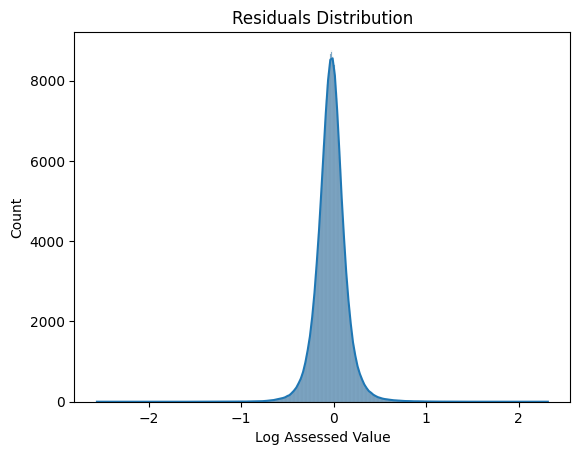

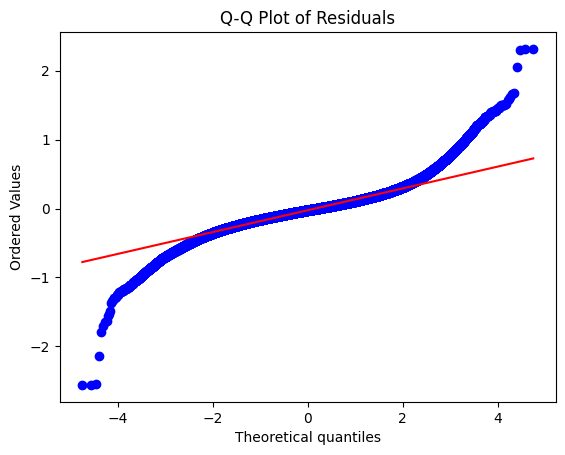

In [ ]:

#y_gbr_all_pred=gbr_pipeline.predict(X)
#residuals_gbr = Y - y_gbr_all_pred
# Histogram with KDE
sns.histplot(residuals_gbr_cv, kde=True)
plt.title("Residuals Distribution")
plt.show()

# Q-Q plot
stats.probplot(residuals_gbr_cv, dist="norm", plot=plt)
plt.title("Q-Q Plot of Residuals")
plt.show()


In [ ]:
# Compute IQR
Q1_gbr = np.percentile(residuals_gbr_cv, 25)
Q3_gbr = np.percentile(residuals_gbr_cv, 75)
IQR_gbr = Q3_gbr - Q1_gbr

# Define outlier bounds
lower_bound_gbr = Q1_gbr - 1.5 * IQR_gbr
upper_bound_gbr = Q3_gbr + 1.5 * IQR_gbr

# Identify outliers
outliers_mask_gbr = (residuals_gbr_cv < lower_bound_gbr) | (residuals_gbr_cv > upper_bound_gbr)
gbr_outliers = df_res[outliers_mask_gbr].copy()

print(f"Number of Gradient Boosting outliers: {len(gbr_outliers)}")

# Optional: Add residuals and outlier flag to the outlier dataframe
gbr_outliers['Residual'] = residuals_gbr_cv[outliers_mask_gbr]
gbr_outliers['Outlier'] = outliers_mask_gbr[outliers_mask_gbr]

Number of Gradient Boosting outliers: 27074


In [ ]:
#confidence interval on residuals
lower_ci, upper_ci = np.percentile(residuals_gbr_cv, [2.5, 97.5])
print(f"95% CI on residuals: ({lower_ci:.2f}, {upper_ci:.2f})")


95% CI on residuals: (-0.35, 0.30)


In [ ]:
gbr_outliers.to_csv('gbr_outliers.csv', index=False)

In [ ]:
path_df= '/content/drive/MyDrive/gbr_outliers.csv'
gbr_outliers_df = pd.read_csv(path_df,low_memory=False)

#Focusing the analysis on the identified overlap: data points that both models agree are outliers.



In [ ]:
# Find agreed outliers: flagged by both models
agreed_outliers_mask = outliers_mask & outliers_mask_gbr

# Extract them into a new DataFrame
agreed_outliers= df_res[agreed_outliers_mask].copy()

# Print result
print(f"Number of agreed outliers: {len(agreed_outliers)}")

Number of agreed outliers: 16848


In [ ]:
df_outliers_Cook = df_res[df_res['Cook_Outlier']].copy()


In [ ]:
# Model-based agreed outliers (RF & GB)

df_agreed_outliers = df_res[agreed_outliers_mask].copy()

# Isolation Forest outliers
df_outliers_IF = df_res.iloc[consistent_outliers].copy()

# Find overlap by index
overlap_mask = df_res.index.isin(df_outliers_IF.index) & df_res.index.isin(df_agreed_outliers.index) & df_res['Cook_Outlier']
df_overlap = df_res[overlap_mask].copy()

print(f"Number of overlapping outliers (COOk&IF & RF+GB): {len(df_overlap)}")


Number of overlapping outliers (COOk&IF & RF+GB): 1698


plot of the agreed anomalies

In [ ]:
import geopandas
data_path2 = '/content/drive/MyDrive/CAPSTONE/Neighbourhood_Boundaries.shp'
neigh_gdf= gpd.read_file(data_path2)

In [ ]:
# 2️⃣ Normalize neighbourhood names for both datasets
neigh_gdf['name_clean'] = neigh_gdf['name'].str.upper().str.strip()
agreed_outliers['Neighbourhood_clean'] = agreed_outliers['Neighbourhood'].str.upper().str.strip()

# 3️⃣ Convert agreed_outliers to GeoDataFrame
outliers_gdf = gpd.GeoDataFrame(
    agreed_outliers,
    geometry=gpd.points_from_xy(agreed_outliers['Longitude'], agreed_outliers['Latitude']),
    crs=neigh_gdf.crs
)

In [ ]:
import folium
from folium.plugins import MarkerCluster

# 1️⃣ Define map center (roughly Edmonton’s coordinates)
edmonton_center = [53.5461, -113.4938]

# 2️⃣ Create Folium map
m = folium.Map(location=edmonton_center, zoom_start=11, tiles='OpenStreetMap')

# 3️⃣ Create a marker cluster for efficiency (optional but useful for 17k points)
marker_cluster = MarkerCluster().add_to(m)

# 4️⃣ Add agreed_outliers to the map
for _, row in df_overlap.iterrows():
    popup_text = f"""
    <b>Neighbourhood:</b> {row['Neighbourhood']}<br>
    <b>Assessed Value:</b> ${row['Assessed Value']:,.0f}<br>
    <b>Property Age:</b> {row['Property Age']} years<br>
    <b>Lot Size:</b> {row['Lot Size']:.0f} m²
    """
    folium.CircleMarker(
        location=[row['Latitude'], row['Longitude']],
        radius=3,
        color='red',
        fill=True,
        fill_opacity=0.6,
        popup=folium.Popup(popup_text, max_width=300)
    ).add_to(marker_cluster)

# 5️⃣ Display the map
m


#Residuals from cooks for over/under assessed

In [ ]:
model = smf.ols(formula=formula, data=df_reg)
reg_results = model.fit()
df_res2["Residuals"] = reg_results.resid
df_res2["Fitted"] = reg_results.fittedvalues


In [ ]:

df_res2=df_res.copy()
df_res2["Residuals"] = results.resid
df_res2["Fitted"] = results.fittedvalues
df_res2["Assessment_Flag"] = df_res2["Residuals"].apply(
    lambda x: "Overassessed" if x > 0 else "Underassessed"
)

AttributeError: 'dict' object has no attribute 'resid'

In [ ]:
tol = 0.01  # small threshold for noise
def assess_flag(x):
    if x > tol:
        return "Overassessed"
    elif x < -tol:
        return "Underassessed"
    else:
        return "Neutral"

df_res["Assessment_Flag"] = df_res["Residuals"].apply(assess_flag)


In [ ]:
df_overlap = df_res[overlap_mask].copy()

df_overlap["Residuals"] = results.resid.loc[df_overlap.index]
df_overlap["Assessment_Flag"] = df_res["Assessment_Flag"].loc[df_overlap.index]


#Now we want to focus on the 17742 that were consistently flagged by both models
##Feature importance on agreed anomalies
##Run SHAP Analysis on Agreed Anomalies
##Check Neighbourhood Concentration


In [ ]:
X_agreed = df_overlap[features]
y_agreed = df_overlap[target]
X_agreed_preprocessed = preprocessor.transform(X_agreed)


In [ ]:
rf_model = pipeline.named_steps['model']
gbr_model = gbr_pipeline.named_steps['model']


In [ ]:
feature_names = preprocessor.get_feature_names_out()

# Random Forest feature importances
rf_importances = pd.DataFrame({
    'Feature': feature_names,
    'Importance_RF': rf_model.feature_importances_
}).sort_values(by='Importance_RF', ascending=False)

# Gradient Boosting feature importances
gbr_importances = pd.DataFrame({
    'Feature': feature_names,
    'Importance_GBR': gbr_model.feature_importances_
}).sort_values(by='Importance_GBR', ascending=False)

#print feature importance of models
print("Random Forest Feature Importances:")
print(rf_importances)

print("\nGradient Boosting Feature Importances:")
print(gbr_importances)

Random Forest Feature Importances:
                        Feature  Importance_RF
0   target_neigh__Neighbourhood       0.368846
9             num__Property Age       0.200189
10            num__Log Lot Size       0.179545
7                 num__Latitude       0.129659
8                num__Longitude       0.088777
5       onehot_zone__Zoning_RSL       0.009763
1       onehot_zone__Zoning_RF1       0.009410
3        onehot_zone__Zoning_RS       0.004410
4       onehot_zone__Zoning_RSF       0.004243
6       onehot_zone__Zoning_RSM       0.003945
2       onehot_zone__Zoning_RF2       0.001213

Gradient Boosting Feature Importances:
                        Feature  Importance_GBR
0   target_neigh__Neighbourhood        0.661902
10            num__Log Lot Size        0.169829
9             num__Property Age        0.117206
7                 num__Latitude        0.020682
8                num__Longitude        0.016109
5       onehot_zone__Zoning_RSL        0.005430
3        onehot_zone__Zon

SHAP Analysis on Gradient boosting model

In [ ]:
import shap

# Extract model and preprocessor
model = gbr_pipeline.named_steps['model']
X_transformed = preprocessor.transform(X_agreed)
feature_names = preprocessor.get_feature_names_out()

# Initialize SHAP explainer
explainer = shap.TreeExplainer(model)
shap_values = explainer.shap_values(X_transformed)

# Convert to DataFrame for easy handling
shap_df = pd.DataFrame(shap_values, columns=feature_names)

# Mean absolute SHAP values = global importance (like feature_importances_)
shap_importance = shap_df.abs().mean().sort_values(ascending=False)
print(shap_importance.head(7))


target_neigh__Neighbourhood    0.231345
num__Property Age              0.152901
num__Log Lot Size              0.123855
num__Latitude                  0.028237
num__Longitude                 0.023150
onehot_zone__Zoning_RS         0.012653
onehot_zone__Zoning_RSL        0.012332
onehot_zone__Zoning_RF1        0.004572
onehot_zone__Zoning_RSF        0.002679
onehot_zone__Zoning_RF2        0.000632
dtype: float64


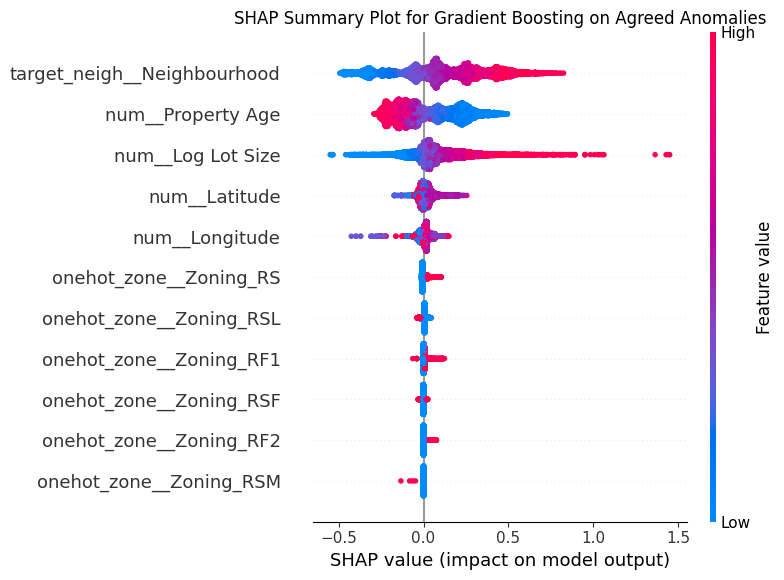

In [ ]:

# 1. Extract model and transformed data
model = gbr_pipeline.named_steps['model']
X_transformed = preprocessor.transform(X_agreed)
feature_names = preprocessor.get_feature_names_out()

# 2. Initialize SHAP explainer
explainer = shap.TreeExplainer(model)
shap_values = explainer.shap_values(X_transformed)

# 3. Convert to SHAP summary-compatible object
X_transformed_df = pd.DataFrame(X_transformed, columns=feature_names)

# 4. SHAP Summary Plot (beeswarm)
shap.summary_plot(shap_values, X_transformed_df, plot_type="dot", show=False)
plt.title("SHAP Summary Plot for Gradient Boosting on Agreed Anomalies")
plt.tight_layout()
plt.show()


Compare numerical distributions

/tmp/ipython-input-2534235812.py:11: FutureWarning: 

Passing `palette` without assigning `hue` is deprecated and will be removed in v0.14.0. Assign the `x` variable to `hue` and set `legend=False` for the same effect.

  sns.boxplot(
/tmp/ipython-input-2534235812.py:24: FutureWarning: 

Passing `palette` without assigning `hue` is deprecated and will be removed in v0.14.0. Assign the `x` variable to `hue` and set `legend=False` for the same effect.

  sns.boxplot(
/tmp/ipython-input-2534235812.py:36: FutureWarning: 

Passing `palette` without assigning `hue` is deprecated and will be removed in v0.14.0. Assign the `x` variable to `hue` and set `legend=False` for the same effect.

  sns.boxplot(


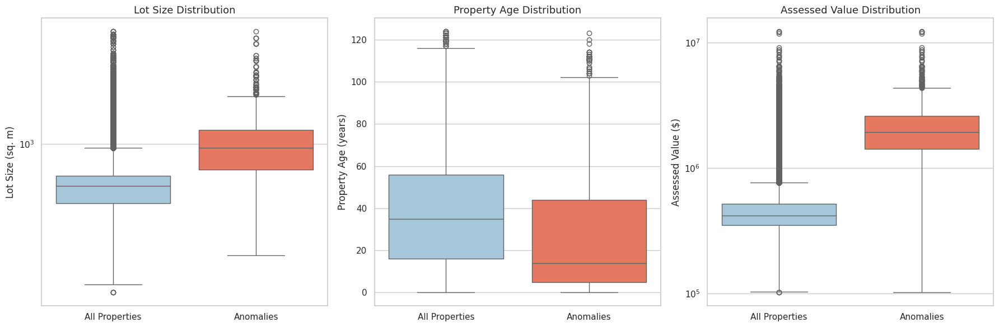

In [ ]:

df_plot = pd.concat([
    df_res.assign(Type='All Properties'),
    df_overlap.assign(Type='Anomalies')
])


fig, axes = plt.subplots(1, 3, figsize=(18, 6))

# --- Boxplot 1: Lot Size ---
sns.boxplot(
    data=df_plot,
    x='Type',
    y='Lot Size',
    palette=['#9ecae1', '#fb6a4a'],
    ax=axes[0]
)
axes[0].set_title('Lot Size Distribution', fontsize=13)
axes[0].set_ylabel('Lot Size (sq. m)')
axes[0].set_xlabel('')
axes[0].set_yscale('log')

# --- Boxplot 2: Property Age ---
sns.boxplot(
    data=df_plot,
    x='Type',
    y='Property Age',
    palette=['#9ecae1', '#fb6a4a'],
    ax=axes[1]
)
axes[1].set_title('Property Age Distribution', fontsize=13)
axes[1].set_ylabel('Property Age (years)')
axes[1].set_xlabel('')

# --- Boxplot 3: Assessed Value ---
sns.boxplot(
    data=df_plot,
    x='Type',
    y='Assessed Value',
    palette=['#9ecae1', '#fb6a4a'],
    ax=axes[2]
)
axes[2].set_title('Assessed Value Distribution', fontsize=13)
axes[2].set_ylabel('Assessed Value ($)')
axes[2].set_xlabel('')
axes[2].set_yscale('log')

# Final layout
plt.tight_layout()
plt.show()


#NUMERICAL COMPARISON
Using Mann whitney U-test compare:

Over-assessed vs Under-assessed

Over-assessed vs Overall population

Under-assessed vs Overall population


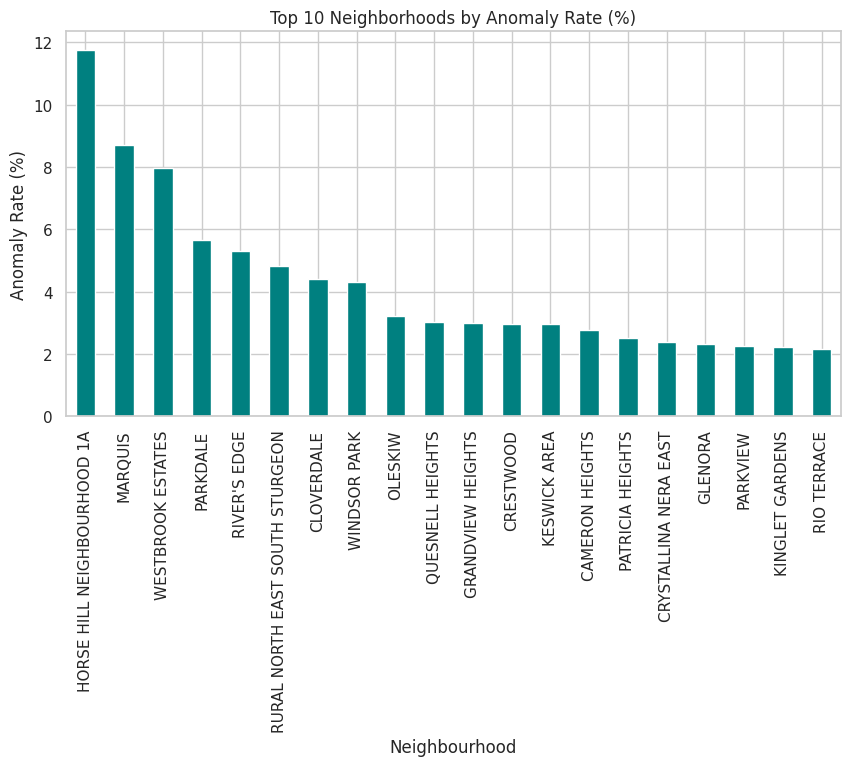

In [ ]:
anomaly_rate = (
    df_overlap['Neighbourhood'].value_counts() /
    df_res['Neighbourhood'].value_counts() * 100
).dropna().sort_values(ascending=False)

anomaly_rate.head(20).plot(kind='bar', figsize=(10,5), color='teal')
plt.title('Top 10 Neighborhoods by Anomaly Rate (%)')
plt.ylabel('Anomaly Rate (%)')
plt.show()


In [ ]:
anomaly_rate.head(20)


,count
Neighbourhood,
HORSE HILL NEIGHBOURHOOD 1A,11.764706
MARQUIS,8.695652
WESTBROOK ESTATES,7.954545
PARKDALE,5.654281
RIVER'S EDGE,5.319149
RURAL NORTH EAST SOUTH STURGEON,4.829545
CLOVERDALE,4.402516
WINDSOR PARK,4.304979
OLESKIW,3.236334


Geospatial analysis to see the top20 neighbourhood distribution of anomalies

In [ ]:
data_path2 = '/content/drive/MyDrive/CAPSTONE/Neighbourhood_Boundaries.shp'
neigh_gdf= gpd.read_file(data_path2)
print(neigh_gdf.columns)
neigh_gdf.head()

Index(['name', 'area_km2', 'number', 'geometry'], dtype='object')


,name,area_km2,number,geometry
0,Abbottsfield,0.40962908136221055,2010,"POLYGON ((-113.38763 53.57613, -113.38363 53.5..."
1,Albany,0.8433122828775174,3460,"POLYGON ((-113.56025 53.6316, -113.55351 53.63..."
2,Alberta Avenue,1.6804705529602084,1010,"POLYGON ((-113.49226 53.57662, -113.49042 53.5..."
3,Alberta Park Industrial,0.6646477542774953,4010,"POLYGON ((-113.59041 53.56654, -113.59039 53.5..."
4,Aldergrove,1.4905967228414734,4020,"POLYGON ((-113.65209 53.5195, -113.65209 53.52..."


In [ ]:
#  Strip whitespace and lowercase everything
anomaly_rate_df = anomaly_rate.reset_index()
anomaly_rate_df.columns = ['Neighbourhood', 'Anomaly_Rate']

df_neigh = anomaly_rate_df.copy()
df_neigh['Neighbourhood_clean'] = df_neigh['Neighbourhood'].str.strip().str.lower()

gdf_neigh = neigh_gdf.copy()
gdf_neigh['name_clean'] = gdf_neigh['name'].str.strip().str.lower()

#  Merge on cleaned names
neigh_merged = gdf_neigh.merge(
    df_neigh,
    left_on='name_clean',
    right_on='Neighbourhood_clean',
    how='left'
)

neigh_merged['Anomaly_Rate'] = neigh_merged['Anomaly_Rate'].fillna(0)

top20_gdf = neigh_merged.sort_values(by='Anomaly_Rate', ascending=False).head(20)



ASSESSING IF ANOMALIES ARE OVER OR UNDERASSESSED

Classify the agreed anomalies as either overassessed or underassessed, based on the direction of their residuals

Positive residual → overassessed

Negative residual → underassessed

Extract the residuals and classified as under/overassed

In [ ]:
# 1. Get residuals for agreed anomalies
residuals_agreed_rf = residuals_cv[overlap_mask]
residuals_agreed_gbr = residuals_gbr_cv[overlap_mask]

# 2. Optionally average the residuals from both models
avg_residuals = (residuals_agreed_rf + residuals_agreed_gbr) / 2

# 3. Get agreed anomalies DataFrame
#agreed_outliers = df_res[overlap_mask].copy()

# 4. Add averaged residuals for reference
df_overlap['avg_residual'] = avg_residuals

# 5. Split based on sign  of residuals
overassessed  = df_overlap[df_overlap['avg_residual'] > 0].copy()
underassessed = df_overlap[df_overlap['avg_residual'] < 0].copy()
df_overlap['Assessment_Type'] = df_overlap['avg_residual'].apply(
    lambda x: 'Under-assessed' if x < 0 else 'Over-assessed'
)

# 6. Print results
print(f"Underassessed properties: {len(underassessed)}")
print(f"Overassessed properties: {len(overassessed)}")


Underassessed properties: 260
Overassessed properties: 1438


In [ ]:
from scipy.stats import mannwhitneyu

def mann_whitney_summary(group1, group2, feature, group1_name, group2_name):
    stat, p_value = mannwhitneyu(group1[feature], group2[feature], alternative='two-sided')
    median1 = group1[feature].median()
    median2 = group2[feature].median()
    print(f"{feature}:")
    print(f"  Median {group1_name} = {median1:.2f}, Median {group2_name} = {median2:.2f}")
    print(f"  U-statistic = {stat:.2f}, p-value = {p_value:.4e}\n")


In [ ]:
numeric_features = ['Lot Size', 'Property Age', 'Assessed Value']

for feature in numeric_features:
    print(f"--- {feature} ---\n")

    # Over-assessed vs Under-assessed
    mann_whitney_summary(overassessed, underassessed, feature, 'Over-assessed', 'Under-assessed')

    # Over-assessed vs Overall population
    mann_whitney_summary(overassessed, df_res, feature, 'Over-assessed', 'Overall population')

    # Under-assessed vs Overall population
    mann_whitney_summary(underassessed, df_res, feature, 'Under-assessed', 'Overall population')


--- Lot Size ---

Lot Size:
  Median Over-assessed = 1000.50, Median Under-assessed = 310.50
  U-statistic = 342173.50, p-value = 5.2594e-101

Lot Size:
  Median Over-assessed = 1000.50, Median Overall population = 556.98
  U-statistic = 905772710.00, p-value = 0.0000e+00

Lot Size:
  Median Under-assessed = 310.50, Median Overall population = 556.98
  U-statistic = 28414151.00, p-value = 2.7741e-80

--- Property Age ---

Property Age:
  Median Over-assessed = 16.00, Median Under-assessed = 1.00
  U-statistic = 277773.00, p-value = 7.7258e-36

Property Age:
  Median Over-assessed = 16.00, Median Overall population = 35.00
  U-statistic = 351057921.50, p-value = 1.4603e-77

Property Age:
  Median Under-assessed = 1.00, Median Overall population = 35.00
  U-statistic = 41511468.00, p-value = 6.8278e-50

--- Assessed Value ---

Assessed Value:
  Median Over-assessed = 2082500.00, Median Under-assessed = 202500.00
  U-statistic = 373729.50, p-value = 2.3318e-145

Assessed Value:
  Median O

Categorical feature comparison

In [ ]:
from scipy.stats import chi2_contingency

# List of categorical features to test
categorical_features = ['Zoning', 'Neighbourhood']

# Comparisons
comparisons = {
    "Over vs Under": (overassessed, underassessed),
    "Over vs Overall": (overassessed, df_res),
    "Under vs Overall": (underassessed, df_res)
}

# Dictionary to store results
chi2_results = {}

for feature in categorical_features:
    chi2_results[feature] = {}

    for comp_name, (group1, group2) in comparisons.items():
        # Build contingency table
       # contingency = pd.crosstab(group1[feature], group2[feature])
        #  Chi-square
        contingency = pd.concat([
         group1[feature].value_counts().rename('group1'),
         group2[feature].value_counts().rename('group2')
       ], axis=1).fillna(0)


        # Run chi-square test
        chi2, p, dof, expected = chi2_contingency(contingency)

        # compute standardized residuals
        residuals = (contingency - expected) / (expected ** 0.5)

        # Store results
        chi2_results[feature][comp_name] = {
            'chi2_stat': chi2,
            'p_value': p,
            'dof': dof,
            'residuals': residuals
        }

# Display results
for feature, comps in chi2_results.items():
    print(f"\nFeature: {feature}")
    for comp_name, result in comps.items():
        print(f"  Comparison: {comp_name}")
        print(f"    Chi2 = {result['chi2_stat']:.2f}, p-value = {result['p_value']:.3e}")



Feature: Zoning
  Comparison: Over vs Under
    Chi2 = 480.07, p-value = 1.599e-101
  Comparison: Over vs Overall
    Chi2 = 78.50, p-value = 1.731e-15
  Comparison: Under vs Overall
    Chi2 = 676.92, p-value = 4.811e-144

Feature: Neighbourhood
  Comparison: Over vs Under
    Chi2 = 1450.19, p-value = 3.598e-244
  Comparison: Over vs Overall
    Chi2 = 14435.57, p-value = 0.000e+00
  Comparison: Under vs Overall
    Chi2 = 9721.09, p-value = 0.000e+00


Zoning
RSF    4.873003
RF1   -2.438680
RF2    1.568142
RSL   -0.747903
RS    -0.693668
RSM    0.621985
dtype: float64


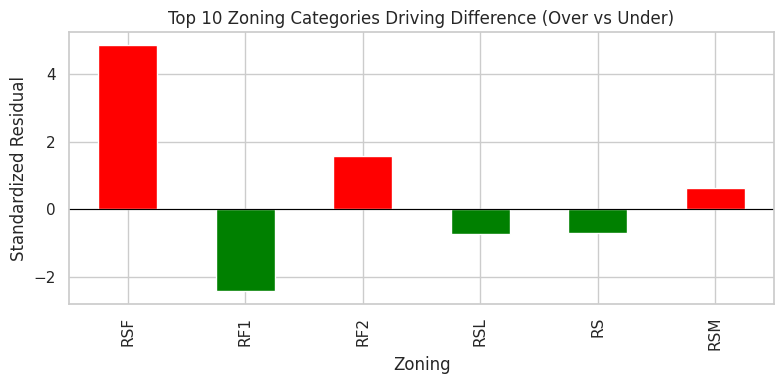

In [ ]:
# Extract residuals for zoning comparison
residuals_zoning = chi2_results['Zoning']['Over vs Under']['residuals']

# Compute average residual per category (some may appear in both groups)
residuals_mean = residuals_zoning.mean(axis=1)

# Sort by magnitude
residuals_sorted = residuals_mean.reindex(residuals_mean.abs().sort_values(ascending=False).index)

# Show top 10
print(residuals_sorted.head(10))

#  Plot
plt.figure(figsize=(8,4))
residuals_sorted.head(10).plot(kind='bar', color=['red' if x > 0 else 'green' for x in residuals_sorted.head(10)])
plt.axhline(0, color='black', linewidth=0.8)
plt.title("Top 10 Zoning Categories Driving Difference (Over vs Under)")
plt.ylabel("Standardized Residual")
plt.tight_layout()
plt.show()


Zoning
RS     3.435282
RSM   -1.501884
RSF   -1.329942
RSL   -0.997142
RF2   -0.791112
RF1   -0.616527
dtype: float64


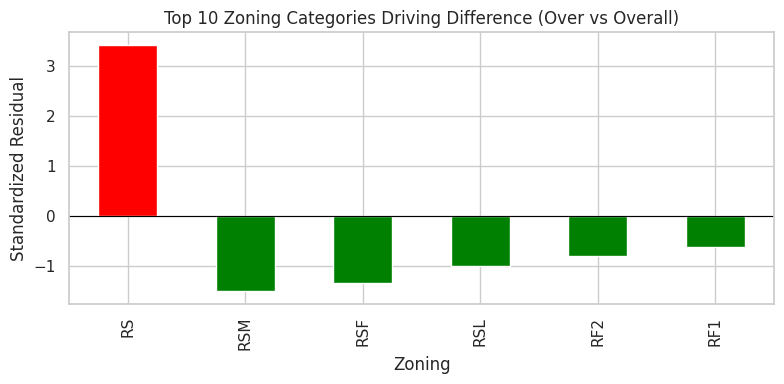

In [ ]:
# Extract residuals for zoning comparison
residuals_zoning = chi2_results['Zoning']['Over vs Overall']['residuals']

# Compute average residual per category (some may appear in both groups)
residuals_mean = residuals_zoning.mean(axis=1)

# Sort by magnitude
residuals_sorted = residuals_mean.reindex(residuals_mean.abs().sort_values(ascending=False).index)

# Show top 10
print(residuals_sorted.head(10))

#  Plot
plt.figure(figsize=(8,4))
residuals_sorted.head(10).plot(kind='bar', color=['red' if x > 0 else 'green' for x in residuals_sorted.head(10)])
plt.axhline(0, color='black', linewidth=0.8)
plt.title("Top 10 Zoning Categories Driving Difference (Over vs Overall)")
plt.ylabel("Standardized Residual")
plt.tight_layout()
plt.show()


Zoning
RSF    11.261163
RF1    -4.733218
RF2     3.175468
RSL    -1.795039
RSM    -0.291078
RS     -0.123972
dtype: float64


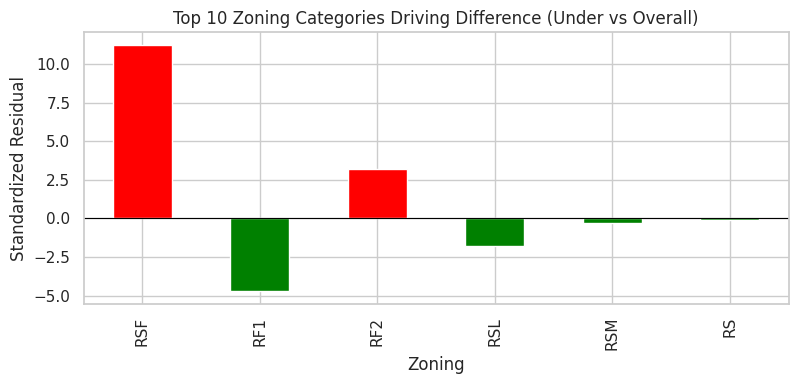

In [ ]:
# Extract residuals for zoning comparison
residuals_zoning = chi2_results['Zoning']['Under vs Overall']['residuals']

# Compute average residual per category
residuals_mean = residuals_zoning.mean(axis=1)

# Sort by magnitude
residuals_sorted = residuals_mean.reindex(residuals_mean.abs().sort_values(ascending=False).index)

# Show top 10
print(residuals_sorted.head(10))

#  Plot
plt.figure(figsize=(8,4))
residuals_sorted.head(10).plot(kind='bar', color=['red' if x > 0 else 'green' for x in residuals_sorted.head(10)])
plt.axhline(0, color='black', linewidth=0.8)
plt.title("Top 10 Zoning Categories Driving Difference (Under vs Overall)")
plt.ylabel("Standardized Residual")
plt.tight_layout()
plt.show()


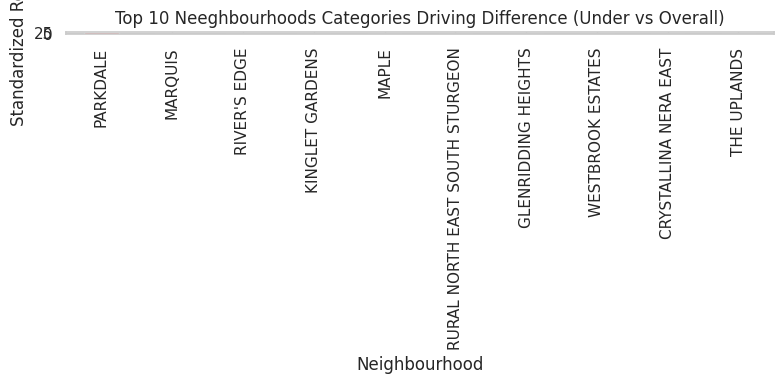

In [ ]:
# Extract residuals for Neighbourhood comparison
residuals_Neigh = chi2_results['Neighbourhood']['Under vs Overall']['residuals']

# Compute average residual per category
residuals_mean = residuals_Neigh.mean(axis=1)

# Sort by magnitude
residuals_sorted = residuals_mean.reindex(residuals_mean.abs().sort_values(ascending=False).index)

# Plot
plt.figure(figsize=(8,4))
residuals_sorted.head(10).plot(kind='bar', color=['red' if x > 0 else 'green' for x in residuals_sorted.head(10)])
plt.axhline(0, color='black', linewidth=0.8)
plt.title("Top 10 Neeghbourhoods Categories Driving Difference (Under vs Overall)")
plt.ylabel("Standardized Residual")
plt.tight_layout()
plt.show()


residuals_Neigh type: <class 'pandas.core.frame.DataFrame'>
shape: (265, 2)
sample (head):
                        group1    group2
Neighbourhood                           
PARKDALE             69.609681 -1.359122
GLENRIDDING HEIGHTS  18.290414 -0.357118
LAUREL                9.867050 -0.192653
MAPLE                20.968884 -0.409415
WESTBROOK ESTATES    17.416193 -0.340049
Top values to plot:
Neighbourhood
PARKDALE                           34.125280
MARQUIS                            14.138453
RIVER'S EDGE                       12.524595
KINGLET GARDENS                    10.927135
MAPLE                              10.279734
RURAL NORTH EAST SOUTH STURGEON     9.096611
GLENRIDDING HEIGHTS                 8.966648
WESTBROOK ESTATES                   8.538072
CRYSTALLINA NERA EAST               7.533919
THE UPLANDS                         7.046068
dtype: float64


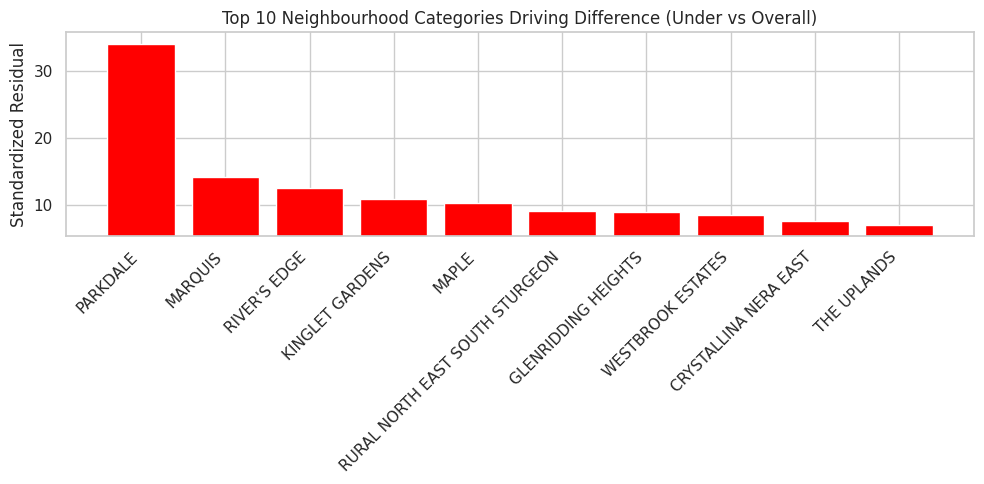

In [ ]:
import matplotlib.pyplot as plt
import pandas as pd
import numpy as np

# --- fetch residuals
residuals_Neigh = chi2_results['Neighbourhood']['Under vs Overall']['residuals']

print("residuals_Neigh type:", type(residuals_Neigh))
try:
    print("shape:", getattr(residuals_Neigh, "shape", None))
except Exception:
    pass
print("sample (head):")
print(getattr(residuals_Neigh, "head", lambda: residuals_Neigh)())

# Compute average residual per category
residuals_mean = None
if isinstance(residuals_Neigh, pd.DataFrame):
    residuals_mean = residuals_Neigh.mean(axis=1)
else:
    # if it's already a Series
    residuals_mean = pd.Series(residuals_Neigh)

# ensure numeric dtype
residuals_mean = pd.to_numeric(residuals_mean, errors='coerce')
residuals_mean = residuals_mean.dropna()

if residuals_mean.empty:
    print("No numeric residuals to plot (series empty after coercion).")
else:
    # Sort by absolute magnitude
    residuals_sorted = residuals_mean.reindex(residuals_mean.abs().sort_values(ascending=False).index)
    top = residuals_sorted.head(10)
    print("Top values to plot:")
    print(top)

    # Prepare colors
    colors = ['red' if v > 0 else 'green' for v in top.values]

    # Plot robustly using matplotlib axes
    fig, ax = plt.subplots(figsize=(10,5))
    bars = ax.bar(top.index.astype(str), top.values, color=colors)
    ax.axhline(0, color='black', linewidth=0.8)
    ax.set_title("Top 10 Neighbourhood Categories Driving Difference (Under vs Overall)")
    ax.set_ylabel("Standardized Residual")
    plt.xticks(rotation=45, ha='right')

    ymin, ymax = top.min(), top.max()
    padding = max(0.05 * max(abs(ymin), abs(ymax)), 1e-6)
    ax.set_ylim(ymin - padding, ymax + padding)

    plt.tight_layout()
    plt.show()


Neighbourhood
PARKDALE                     3.679712
GLENRIDDING HEIGHTS          2.850293
LAUREL                       2.781601
MAPLE                        2.781601
ROSENTHAL                    1.966889
HAWKS RIDGE                  1.865954
KINGLET GARDENS              1.865954
CRYSTALLINA NERA WEST        1.759239
THE UPLANDS                  1.734637
THE ORCHARDS AT ELLERSLIE    1.645617
dtype: float64


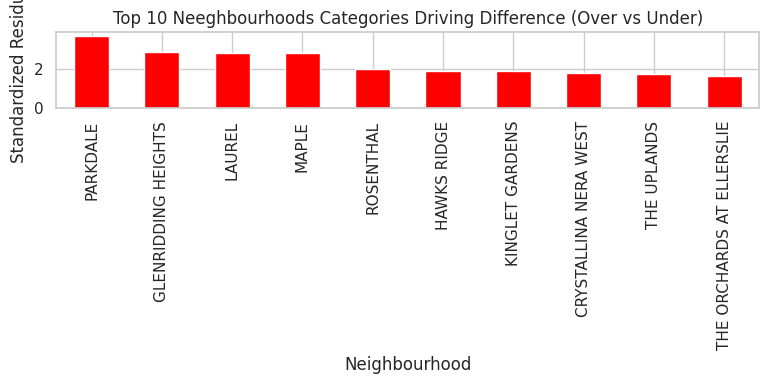

In [ ]:
# Extract residuals for Neighbourhood comparison
residuals_Neigh = chi2_results['Neighbourhood']['Over vs Under']['residuals']

# Compute average residual per category
residuals_mean = residuals_Neigh.mean(axis=1)

# Sort by magnitude
residuals_sorted = residuals_mean.reindex(residuals_mean.abs().sort_values(ascending=False).index)

# Show top 10
print(residuals_sorted.head(10))

#  Plot
plt.figure(figsize=(8,4))
residuals_sorted.head(10).plot(kind='bar', color=['red' if x > 0 else 'green' for x in residuals_sorted.head(10)])
plt.axhline(0, color='black', linewidth=0.8)
plt.title("Top 10 Neeghbourhoods Categories Driving Difference (Over vs Under)")
plt.ylabel("Standardized Residual")
plt.tight_layout()
plt.show()


Neighbourhood
WESTBROOK ESTATES              22.728146
OLESKIW                        18.738853
WINDSOR PARK                   18.040597
CRESTWOOD                      15.952994
PARKVIEW                       15.145184
GLENORA                        14.463173
CAMERON HEIGHTS                12.805634
HORSE HILL NEIGHBOURHOOD 1A    12.372720
KESWICK AREA                   10.723995
GRANDVIEW HEIGHTS              10.407248
dtype: float64


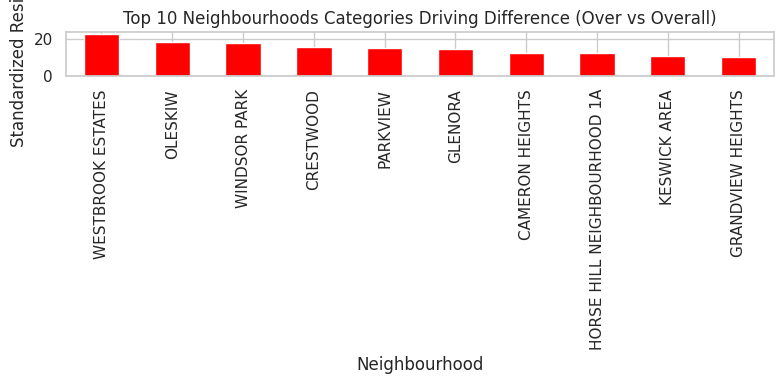

In [ ]:
# Extract residuals for Neighbourhood comparison
residuals_Neigh = chi2_results['Neighbourhood']['Over vs Overall']['residuals']

# Compute average residual per category
residuals_mean = residuals_Neigh.mean(axis=1)

# Sort by magnitude
residuals_sorted = residuals_mean.reindex(residuals_mean.abs().sort_values(ascending=False).index)

# Show top 10
print(residuals_sorted.head(10))

#  Plot
plt.figure(figsize=(8,4))
residuals_sorted.head(10).plot(kind='bar', color=['red' if x > 0 else 'green' for x in residuals_sorted.head(10)])
plt.axhline(0, color='black', linewidth=0.8)
plt.title("Top 10 Neighbourhoods Categories Driving Difference (Over vs Overall)")
plt.ylabel("Standardized Residual")
plt.tight_layout()
plt.show()


In [ ]:
import folium
from folium.plugins import MarkerCluster

# -----------------------------------
# 1. Center the map on Edmonton
# -----------------------------------
map_center = [df_overlap['Latitude'].mean(), df_overlap['Longitude'].mean()]
m = folium.Map(location=map_center, zoom_start=11, tiles='cartodbpositron')

# -----------------------------------
# 2. Create marker clusters for readability
# -----------------------------------
cluster_over  = MarkerCluster(name="Over-assessed").add_to(m)
cluster_under = MarkerCluster(name="Under-assessed").add_to(m)

# -----------------------------------
# 3. Add points to the map
# -----------------------------------
for _, row in df_overlap.iterrows():

    popup_text = f"""
    <b>Neighbourhood:</b> {row['Neighbourhood']}<br>
    <b>Assessed Value:</b> ${row['Assessed Value']:,.0f}<br>
    <b>Residual:</b> {row['avg_residual']:.3f}<br>
    <b>Assessment Type:</b> {row['Assessment_Type']}
    """

    if row['Assessment_Type'] == "Over-assessed":
        folium.CircleMarker(
            location=[row['Latitude'], row['Longitude']],
            radius=3,
            color="red",
            fill=True,
            fill_opacity=0.7,
            popup=popup_text
        ).add_to(cluster_over)

    else:  # Under-assessed
        folium.CircleMarker(
            location=[row['Latitude'], row['Longitude']],
            radius=3,
            color="green",
            fill=True,
            fill_opacity=0.7,
            popup=popup_text
        ).add_to(cluster_under)

# -----------------------------------
# 4. Add layer control
# -----------------------------------
folium.LayerControl().add_to(m)

# -----------------------------------
# 5. Display map
# -----------------------------------
m


In [ ]:

# --- Ensure predicted and actual values are on original scale ---

agreed_outliers['Predicted_Value_Orig'] = np.exp(agreed_outliers['Predicted_Value'])
agreed_outliers['Actual_Value_Orig'] = np.exp(agreed_outliers['Log Assessed Value'])

# Compute property-level revenue impact
agreed_outliers['Revenue_Impact'] = agreed_outliers['Predicted_Value_Orig'] - agreed_outliers['Actual_Value_Orig']

# Split over- and under-assessed
overassessed = agreed_outliers[agreed_outliers['avg_residual'] > 0].copy()
underassessed = agreed_outliers[agreed_outliers['avg_residual'] < 0].copy()

# Function to compute neighborhood-level revenue impact as %
def neighborhood_revenue_pct(df):
    impact = df.groupby('Neighbourhood').agg(
        Revenue_Impact_USD=('Revenue_Impact', 'sum'),
        Total_Assessed=('Actual_Value_Orig', 'sum')
    )
    impact['Revenue_Impact_%'] = (impact['Revenue_Impact_USD'] / impact['Total_Assessed']) * 100
    return impact[['Revenue_Impact_%']].reset_index()

# Compute per neighborhood
over_impact = neighborhood_revenue_pct(overassessed).rename(columns={'Revenue_Impact_%': 'Revenue_Impact_%_Over'})
under_impact = neighborhood_revenue_pct(underassessed).rename(columns={'Revenue_Impact_%': 'Revenue_Impact_%_Under'})

# Merge
revenue_impact_summary = pd.merge(over_impact, under_impact, on='Neighbourhood', how='outer').fillna(0)
revenue_impact_summary['Net_Impact_%'] = revenue_impact_summary['Revenue_Impact_%_Over'] + revenue_impact_summary['Revenue_Impact_%_Under']

# Sort by net impact
revenue_impact_summary = revenue_impact_summary.sort_values(by='Net_Impact_%', key=abs, ascending=False)

# Display top neighborhoods
print(revenue_impact_summary.head(20))


                   Neighbourhood  Revenue_Impact_%_Over  \
217                   SHERBROOKE             -25.695866   
189                POTTER GREENS             -23.653120   
164                       MCLEOD             -24.387135   
43                       CANOSSA             -23.284393   
150                      LYMBURN             -22.854550   
157                      MARQUIS               0.000000   
162              MCCONACHIE AREA             -23.284565   
75                        EBBERS             -22.518692   
135              KINGLET GARDENS             -24.329348   
8                          ASTER               0.000000   
117  HORSE HILL NEIGHBOURHOOD 1A               0.000000   
68               DESROCHERS AREA             -25.463756   
197                  RAPPERSWILL             -23.082219   
160                    MAYLIEWAN             -28.600887   
174                NORTH GLENORA             -29.113322   
2                     ALDERGROVE             -25.475327 

Comparing the distribution of top20 neighbourhood with normal properties

In [ ]:
# Ensure lowercase matching for safety
df_res['Neighbourhood_clean'] = df_res['Neighbourhood'].str.strip().str.lower()

top20_properties = df_res[df_res['Neighbourhood_clean'].isin(top20_list)].copy()
# Means for all properties
summary_all = df_res[feature_cols].mean().to_frame('All Properties')

# Means for properties in top 20 anomalous neighbourhoods
summary_top20 = top20_properties[feature_cols].mean().to_frame('Top 20 Neighbourhoods')
comparison_top20 = summary_all.join(summary_top20)
print(comparison_top20)


              All Properties  Top 20 Neighbourhoods
Latitude           53.521984              53.519840
Longitude        -113.512968            -113.552065
Property Age       36.370517              52.812492
Log Lot Size        6.295672               6.486097


Boxplot for features comparing all properties vs top 20 properties

/tmp/ipython-input-3101707613.py:5: FutureWarning: 

Passing `palette` without assigning `hue` is deprecated and will be removed in v0.14.0. Assign the `x` variable to `hue` and set `legend=False` for the same effect.

  sns.boxplot(
/tmp/ipython-input-3101707613.py:16: FutureWarning: 

Passing `palette` without assigning `hue` is deprecated and will be removed in v0.14.0. Assign the `x` variable to `hue` and set `legend=False` for the same effect.

  sns.boxplot(
/tmp/ipython-input-3101707613.py:26: FutureWarning: 

Passing `palette` without assigning `hue` is deprecated and will be removed in v0.14.0. Assign the `x` variable to `hue` and set `legend=False` for the same effect.

  sns.boxplot(


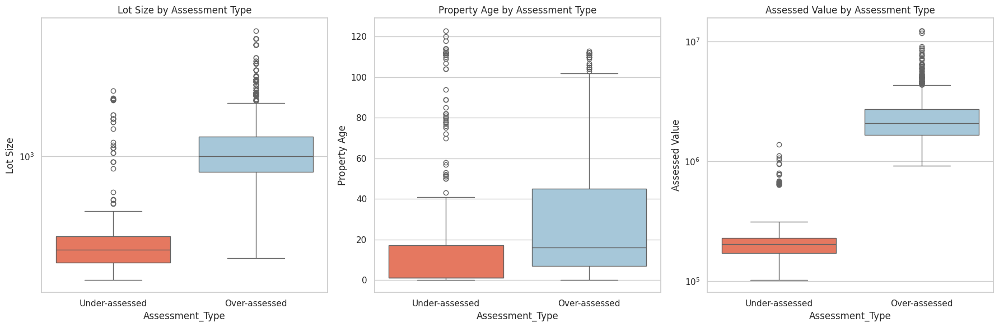

In [ ]:


# Set up the figure
fig, axes = plt.subplots(1, 3, figsize=(18, 6))

# Lot Size
sns.boxplot(
    data=df_overlap,
    x='Assessment_Type',
    y='Lot Size',
    palette=['#fb6a4a', '#9ecae1'],  # under: red, over: blue
    ax=axes[0]
)
axes[0].set_title('Lot Size by Assessment Type')
axes[0].set_yscale('log')  # helps with skewness

# Property Age
sns.boxplot(
    data=df_overlap,
    x='Assessment_Type',
    y='Property Age',
    palette=['#fb6a4a', '#9ecae1'],
    ax=axes[1]
)
axes[1].set_title('Property Age by Assessment Type')

# Assessed Value
sns.boxplot(
    data=df_overlap,
    x='Assessment_Type',
    y='Assessed Value',
    palette=['#fb6a4a', '#9ecae1'],
    ax=axes[2]
)
axes[2].set_title('Assessed Value by Assessment Type')
axes[2].set_yscale('log')

# Tidy layout
plt.tight_layout()
plt.show()


/tmp/ipython-input-3556905874.py:12: FutureWarning: 

Passing `palette` without assigning `hue` is deprecated and will be removed in v0.14.0. Assign the `x` variable to `hue` and set `legend=False` for the same effect.

  sns.boxplot(
/tmp/ipython-input-3556905874.py:24: FutureWarning: 

Passing `palette` without assigning `hue` is deprecated and will be removed in v0.14.0. Assign the `x` variable to `hue` and set `legend=False` for the same effect.

  sns.boxplot(
/tmp/ipython-input-3556905874.py:35: FutureWarning: 

Passing `palette` without assigning `hue` is deprecated and will be removed in v0.14.0. Assign the `x` variable to `hue` and set `legend=False` for the same effect.

  sns.boxplot(


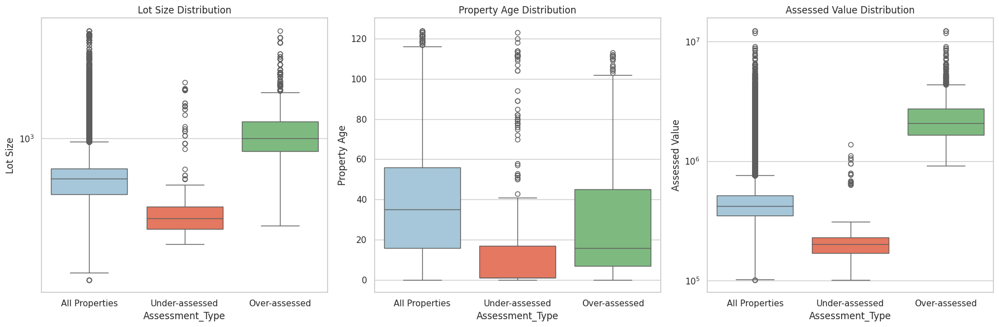

In [ ]:


# Add a column to full dataset to mark normal properties
df_res_plot = df_res.copy()
df_res_plot['Assessment_Type'] = 'All Properties'

# Combine normal properties with overlap outliers
df_plot = pd.concat([df_res_plot, df_overlap], axis=0)

# Set up the figure
fig, axes = plt.subplots(1, 3, figsize=(18, 6))

# Lot Size
sns.boxplot(
    data=df_plot,
    x='Assessment_Type',
    y='Lot Size',
    palette=['#9ecae1', '#fb6a4a', '#74c476'],  # normal, under, over
    order=['All Properties', 'Under-assessed', 'Over-assessed'],
    ax=axes[0]
)
axes[0].set_title('Lot Size Distribution')
axes[0].set_yscale('log')

# Property Age
sns.boxplot(
    data=df_plot,
    x='Assessment_Type',
    y='Property Age',
    palette=['#9ecae1', '#fb6a4a', '#74c476'],
    order=['All Properties', 'Under-assessed', 'Over-assessed'],
    ax=axes[1]
)
axes[1].set_title('Property Age Distribution')

# Assessed Value
sns.boxplot(
    data=df_plot,
    x='Assessment_Type',
    y='Assessed Value',
    palette=['#9ecae1', '#fb6a4a', '#74c476'],
    order=['All Properties', 'Under-assessed', 'Over-assessed'],
    ax=axes[2]
)
axes[2].set_title('Assessed Value Distribution')
axes[2].set_yscale('log')

plt.tight_layout()
plt.show()
